First we try to get the yolov5 clone in our google colab project. Then we set the runtime to GPU.

In [2]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16772, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 16772 (delta 39), reused 45 (delta 20), pack-reused 16679
Receiving objects: 100% (16772/16772), 15.39 MiB | 13.96 MiB/s, done.
Resolving deltas: 100% (11518/11518), done.
/content/yolov5/yolov5
Setup complete. Using torch 2.3.0+cu121 (Tesla T4)


Setting up the environment and importing the dataset from roboflow.

In [3]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="qmXdlsKqVuURfIBX1JvQ")
project = rf.workspace("proj-sfl83").project("grasp-6")
version = project.version(7)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/grasp-6-7 in yolov5pytorch:: 100%|██████████| 6184/6184 [00:01<00:00, 5550.43it/s]


# Training Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [5]:
!python train.py --img 416 --batch 16 --epochs 30 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-07-12 11:19:38.155171: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-12 11:19:38.155224: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-12 11:19:38.156600: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/grasp-6-7/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=Fal

# Metrics Over Epochs for the first 30 epochs:
### Epochs 0-9:
- **Epoch 0:** Initial results with low Precision (P) 0.128 and Recall (R) 0.367.
- **Epoch 1:** An improvement in Precision (0.211) but lower Recall (0.193).
- **Epoch 3:** Noticeable increase in mAP50 to 0.502.
- **Epoch 6:** Further improvements with Precision and Recall at 0.708, and mAP50 at 0.736.
- **Epoch 9:** Best results so far with mAP50 at 0.88.

### Epochs 10-19:
- **Epoch 10:** Consistent improvements with mAP50 at 0.887.
- **Epoch 14:** mAP50-95 increased to 0.679.
- **Epoch 19:** Highest mAP50-95 at 0.71 so far.

### Epochs 20-29:
- **Epoch 21:** Highest mAP50 so far at 0.912.
- **Epoch 28:** mAP50-95 stabilized around 0.747.
- **Epoch 29:** Consistently high performance with mAP50 at 0.924 and mAP50-95 at 0.749.

## Loss Analysis:
- **Box Loss:** Gradually decreases from 0.08248 in Epoch 0 to 0.02452 in Epoch 31.
- **Objectness Loss:** Also reduces from 0.0398 in Epoch 0 to 0.01962 in Epoch 31.
- **Classification Loss:** Starts at 0.07633 in Epoch 0 and decreases to 0.007367 in Epoch 31.

## Performance Metrics:
- **Precision (P):** Increases significantly from 0.112 in Epoch 0 to around 0.866 by Epoch 31.
- **Recall (R):** Improves from 0.367 in Epoch 0 to around 0.807 by Epoch 31.
- **mAP50:** Steady increase from 0.128 in Epoch 0 to 0.924 in Epoch 31.
- **mAP50-95:** Shows steady growth from 0.0673 in Epoch 0 to around 0.749 by Epoch 31.

## Key Takeaways:
- **Consistent Improvement:** The model shows consistent improvement in precision, recall, and mean average precision (mAP) over the epochs.
- **Loss Reduction:** Steady reduction in box, objectness, and classification losses indicates effective learning.
- **Stabilization:** mAP50 and mAP50-95 metrics stabilize around high values in the later epochs, suggesting the model is converging.

Overall, the training process demonstrates effective learning and significant improvement in model performance.

# time of training each epoch:
Epoch 0/29: 39 seconds

Epoch 1/29: 33 seconds

Epoch 2/29: 33 seconds

Epoch 3/29: 33 seconds

Epoch 4/29: 32 seconds

Epoch 5/29: 32 seconds

Epoch 6/29: 31 seconds

Epoch 7/29: 30 seconds

Epoch 8/29: 31 seconds

Epoch 9/29: 32 seconds

Epoch 10/29: 33 seconds

Epoch 11/29: 33 seconds

Epoch 12/29: 29 seconds

Epoch 13/29: 31 seconds

Epoch 14/29: 31 seconds

Epoch 15/29: 30 seconds

Epoch 16/29: 28 seconds

Epoch 17/29: 31 seconds

Epoch 18/29: 31 seconds

Epoch 19/29: 31 seconds

Epoch 20/29: 28 seconds

Epoch 21/29: 29 seconds

Epoch 22/29: 31 seconds

Epoch 23/29: 32 seconds

Epoch 24/29: 30 seconds

Epoch 25/29: 28 seconds

Epoch 26/29: 30 seconds

Epoch 27/29: 31 seconds

Epoch 28/29: 32 seconds

Epoch 29/29: 28 seconds



# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of test_images.

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [31]:
import os
os.chdir('/content/yolov5')

In [37]:
!mkdir /content/test_images/
!cp /content/drive/MyDrive/test_images/* /content/test_images/

mkdir: cannot create directory ‘/content/test_images/’: File exists


In [41]:
!python detect.py --weights /content/yolov5/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/test_images/

detect: weights=['/content/yolov5/yolov5/runs/train/exp/weights/best.pt'], source=/content/test_images/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-339-g150a1a31 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7061368 parameters, 0 gradients, 15.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/10 /content/test_images/IMG_1246.JPG: 416x320 2 juice-laying-s, 1 logo, 47.9ms
image 2/10 /content/test_images/IMG_3025.JPG: 416x320 1 juice-laying-, 1 logo, 1 rani-laying-, 1 rani-standing-, 8.2ms
image 3/10 /content/test_images/IMG_3236.JPG: 416x320 4 k

As it can be seen the knives and spoons that look transparent are harder to detect.

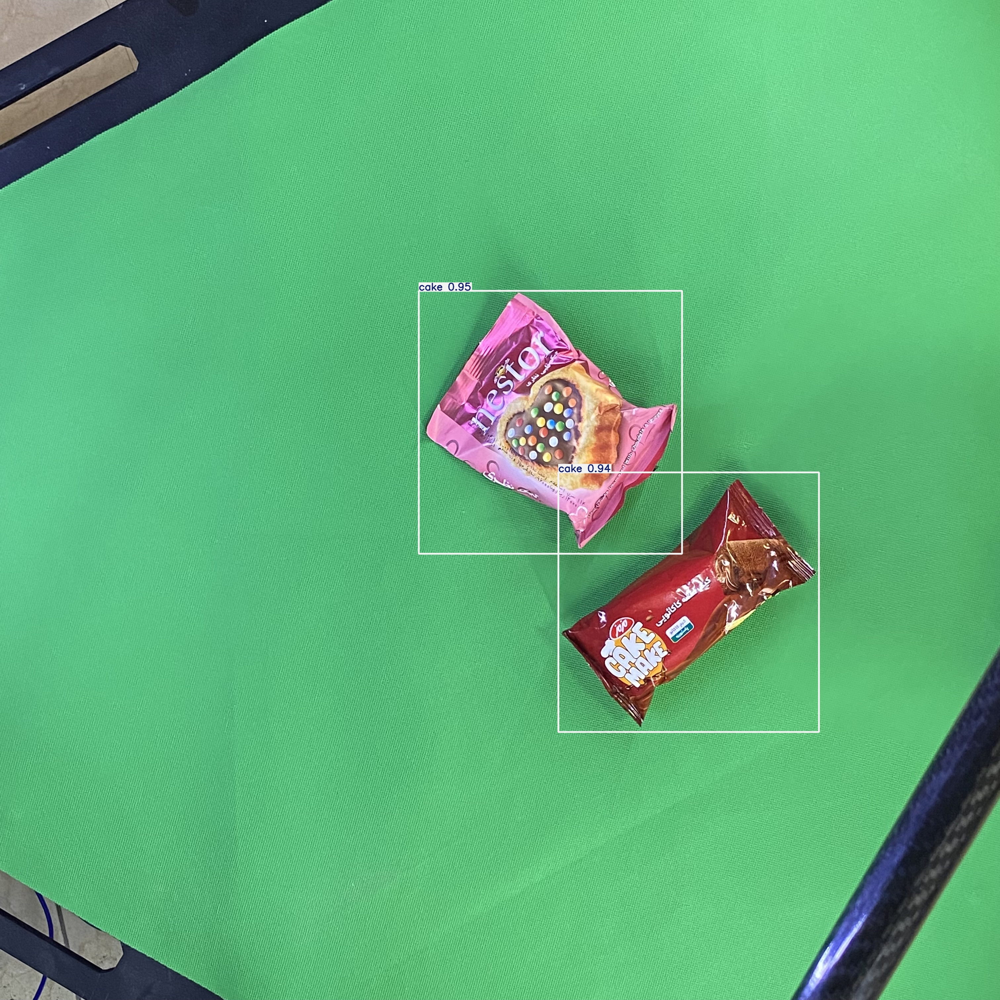

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp8/*.JPG'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")